# Fitting to the NISISS AMI Commissioning Data

In [1]:
import os
os.environ["XLA_FLAGS"] = '--xla_force_host_platform_device_count=2'

import jax
import jax.numpy as np
import jax.scipy as jsp
jax.config.update("jax_enable_x64", True)

import dLux as dl
import dLux.utils as dlu
import dLuxWebbpsf as dlw
from nrm_analysis.misctools import mask_definitions

import optax
import zodiax as zdx
from zodiax.experimental import serialise, deserialise

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from matplotlib import colormaps
import matplotlib.colors as colors
%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = 'lower'
plt.rcParams['figure.dpi'] = 120

# Main functions
from lib import (
    get_webb_osys_fits,
    initialise_for_data,
    UVSource,
    get_AMI_splodge_mask,
    Null,
    Interpolator,
    FIM, 
    PupilAmplitudes,
    FresnelOptics,
    planck,
    fit_image,
    get_files,
    summarise_files
)

# Plotting functions
from lib import (
    compare,
    show_splodges,
    pairwise_vectors,
    plot_vis,
    get_nan_support,
    plot_image,
)

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-062 CANNOT BE CHECKED AGAINST ONLINE VERSION


## Get and look at the data


6
  TARGPROP: HD-36805, HD-37093
  FILTER: F480M, F380M, F430M
  OBSERVTN: 016, 019
  PATTTYPE: NONE
  ACT_ID: 02, 03, 04
  NGROUPS: 3, 4, 6, 9, 12
  NINTS: 65, 78, 82, 118, 122, 61
  DURATION: 39.294, 44.959, 46.903, 50.341, 60.409, 61.041
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI


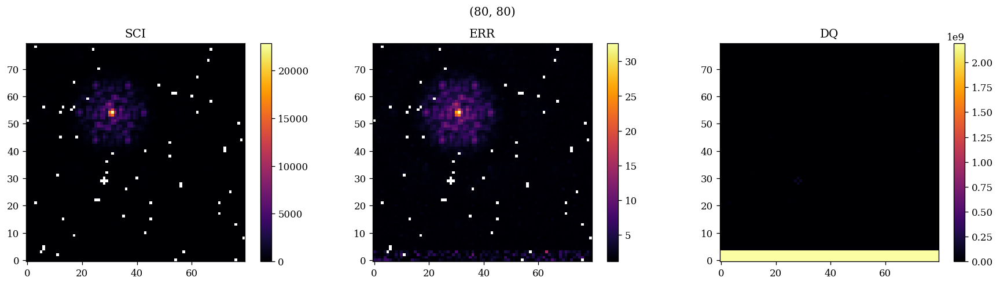

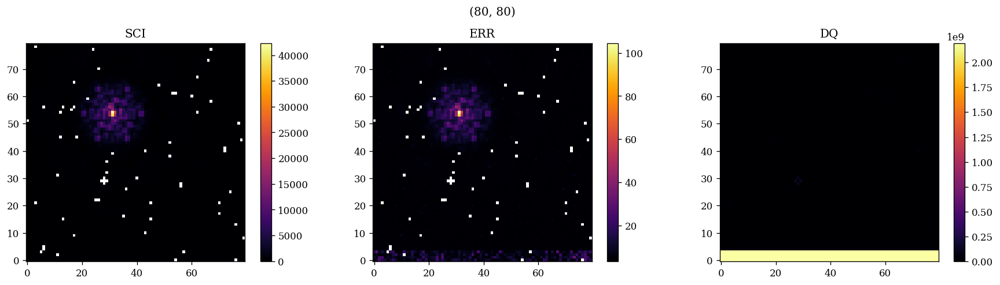

In [2]:
# Bind file path, type and exposure type
file_fn = lambda **kwargs: get_files(
    "/Users/louis/Data/JWST/COM1093/stage2/",
    "cal",
    EXP_TYPE="NIS_AMI",
    PATTTYPE="NONE",
    # FILTER="F480M",
    OBSERVTN=["013", "016", "019"],
    **kwargs,
)

Teffs = {"AB-DOR": 5280, "HD-37093": 4410, "HD-36805": 5040}

stars = ["HD-37093", "HD-36805"]

files = []
for star in stars:
    fs = file_fn(TARGPROP=star)
    # print(f"\n{len(fs)}")
    # summarise_files(fs, ["ACT_ID"])
    files += fs

# files = files[-2:]

print(f"\n{len(files)}")
summarise_files(
    files,
    [
        "ACT_ID",
        "NGROUPS",
        "NINTS",
        "DURATION",
        "APERNAME",
        "PUPIL",
        "SUBARRAY",
        "DETECTOR",
        "DATAMODL",
        "INSTRUME",
        "EXP_TYPE",
    ],
)

for file in files[:2]:
    plot_image(file, 0)

## Set up the optimisation

Define `grad_fn`, that processes our gradients for optimisation.

Define `norm_fn`, that processes our normalisation for optimisation.

In [3]:
# Zero out gradients before the start value
def grad_fn(grads, config, i):
    params = list(config.keys())
    starts = [config[param]["start"] for param in params]
    for param, start in zip(params, starts):
        if i < start:
            grads = grads.multiply(param, 0.0)
    return grads

# Normalise the various components of the model
def norm_fn(model):
    # Normalise the source weights
    floor_weights = np.maximum(model.weights, 1e-8)
    norm_weights = floor_weights / floor_weights.sum()
    model = model.set("weights", norm_weights)

    # Normalise the visibility amplitudes
    norm_ampls = model.amplitudes / model.amplitudes.max()
    model = model.set("amplitudes", norm_ampls)

    # Normalise the IPC kernel
    floor_ipc = np.maximum(model.IPC.kernel, 0.0)
    norm_ipc = model.IPC.kernel / model.IPC.kernel.sum()
    model = model.set("IPC.kernel", norm_ipc)

    return model

## Fit to the data

In [5]:
n_mask = 5
dilate = 1
for file in tqdm(files):

    # Check for already fit
    head = file[0].header
    name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
    print(f"Fitting: {name}")

    # if name + '.zdx' in os.listdir('files/models/'):
    #     print(f"Already fit {name}, skipping\n")
    #     continue

    inst, psf_fits = get_webb_osys_fits(file)
    planes = inst.optsys.planes

    # Get the wavelengths, extend them by 10%, finely sample them
    wls = np.array([psf_fits[0].header[f"WAVE{i}"] for i in range(9)])
    wls = np.linspace(0.9 * wls.min(), 1.1 * wls.max(), 20)
    wgts = np.ones_like(wls) / len(wls)

    # Get the dLux object
    tel = dlw.NIRISS(
        filter=inst.filter,
        aperture=inst.aperturename,
        detector=inst.detector,
        pupil_mask=inst.pupil_mask,
        radial_orders=[0,1,2,3], # Everything up to fourth radial order
        secondary_radial_orders=[2,3], # Skip piston, tip and tilt
        AMI=True,
    )

    # Create a 'clean' telescope 
    tel = tel.set(['aberrations', 'ChargeDiffusion', 'SIAF'], Null())

    # Normalise basis to nm
    tel = tel.multiply(["basis.primary", "basis.secondary"], 1e-9) 

    # Update with the latest WFS data
    tel = tel.set("pupil.opd", np.array(planes[0].opd))
    # tel = tel.set("aberrations.opd", np.array(planes[2].opd))

    # Make the AMI mask interpolatable
    tf = dl.CoordTransform((0.0, 0.0), 0.0, (1.0, 1.0), (0.0, 0.0))
    tel = tel.set('pupil_mask', Interpolator(tel.pupil_mask, tf))

    # Ensure psf_npixels is set correctly for mask generation
    tel = initialise_for_data(tel, file)

    # Generate Mask
    mask_path = f"files/masks/{head['FILTER']}.npy"
    if os.path.exists(mask_path):
        masks = np.load(mask_path)
    else:
        print("Generating mask")
        masks = get_AMI_splodge_mask(tel, wls, verbose=False)
        np.save(mask_path, masks)

    # Create source
    source = UVSource(wls, masks, flux=tel.flux, position=tel.position, weights=wgts)
    model = tel.set("source", source)

    # Set up the optimisation configuration
    s1, s2 = 5, 25
    config = {
        'position':               {'start': 0, 'optim': optax.sgd(2e-10)},
        'coefficients.primary':   {'start': 2, 'optim': optax.sgd(1e-2)},
        'coefficients.secondary': {'start': 2, 'optim': optax.sgd(1e-3)},

        'flux':            {'start': s1,  'optim': optax.sgd(1e6)},
        'IPC.kernel':      {'start': s1,  'optim': optax.sgd(5e-10)},
        'weights':         {'start': s1,  'optim': optax.sgd(1e-8)},
        'psf_pixel_scale': {'start': s1,  'optim': optax.sgd(5e-15)},
        'translation':     {'start': s1+5, 'optim': optax.sgd(5e-4)},
        'rotation':        {'start': s1+5, 'optim': optax.sgd(2e-10)},
        'compression':     {'start': s1+5, 'optim': optax.sgd(2e-10)},
        'shear':           {'start': s1+5, 'optim': optax.sgd(2e-10)},

        'amplitudes': {'start': s2, 'optim': optax.sgd(1e-7)},
        'phases':     {'start': s2, 'optim': optax.sgd(1e-7)},
    }

    # Get the data
    im = np.array(file[1].data).astype(float)
    err = np.array(file[2].data).astype(float)
    support_mask = get_nan_support(file, n_mask=n_mask, order=dilate)
    support = np.where(support_mask)

    def loglike_fn(model, data, err):
        return jsp.stats.norm.logpdf(
            model.model()[*support], loc=data[*support], scale=err[*support]
        )
    
    # Loss function
    @zdx.filter_jit
    @zdx.filter_value_and_grad(list(config.keys()))
    def loss_fn(model, data, err):
        return -loglike_fn(model, data, err).sum()

    # Optimisation
    losses, models_out = fit_image(
        model, im, err, loss_fn, grad_fn, norm_fn, 100, config

    )
    print(f"Final loss: {losses[-1] * 1e-4}")

    # Fisher information
    marg_params = ["position", "flux", "amplitudes", "phases"]
    print(f"Calculating Fisher Information, marginalising over {marg_params}")
    llike_fn = lambda model: loglike_fn(model, im, err).sum()
    # FIM_fn = zdx.filter_jit(FIM)
    fim = FIM(models_out[-1], marg_params, llike_fn)

    # Get the params from each model
    params_out = {}
    for param in config.keys():
        params_out[param] = [model.get(param) for model in models_out]

    serialise(f"files/models/{name}.zdx", models_out[-1])
    serialise(f"files/params/{name}.zdx", params_out)
    np.save(f"files/losses/{name}.npy", losses)
    np.save(f"files/fims/{name}", fim)

  0%|          | 0/6 [00:00<?, ?it/s]

Fitting: HD-37093_F430M_016_03
Loading WFS data
Compiling...


Loss 393.64:   0%|          | 0/100 [00:00<?, ?it/s]

Final loss: 10.262389636473419
Calculating Fisher Information, marginalising over ['position', 'flux', 'amplitudes', 'phases']
Fitting: HD-37093_F380M_016_04
Loading WFS data
Compiling...


Loss 305.18:   0%|          | 0/100 [00:00<?, ?it/s]

Final loss: 8.941438683661737
Calculating Fisher Information, marginalising over ['position', 'flux', 'amplitudes', 'phases']
Fitting: HD-37093_F480M_016_02
Loading WFS data
Compiling...


Loss 392.18:   0%|          | 0/100 [00:00<?, ?it/s]

Final loss: 7.508201007621302
Calculating Fisher Information, marginalising over ['position', 'flux', 'amplitudes', 'phases']
Fitting: HD-36805_F430M_019_03
Loading WFS data
Compiling...


Loss 383.43:   0%|          | 0/100 [00:00<?, ?it/s]

Final loss: 9.865017653326293
Calculating Fisher Information, marginalising over ['position', 'flux', 'amplitudes', 'phases']
Fitting: HD-36805_F380M_019_04
Loading WFS data
Compiling...


Loss 251.28:   0%|          | 0/100 [00:00<?, ?it/s]

Final loss: 8.532500504242218
Calculating Fisher Information, marginalising over ['position', 'flux', 'amplitudes', 'phases']
Fitting: HD-36805_F480M_019_02
Loading WFS data
Compiling...


Loss 488.76:   0%|          | 0/100 [00:00<?, ?it/s]

Final loss: 8.383881131391453
Calculating Fisher Information, marginalising over ['position', 'flux', 'amplitudes', 'phases']


\nPlotting: HD-37093_F430M_016_03

Final loss: 10.262389636473419


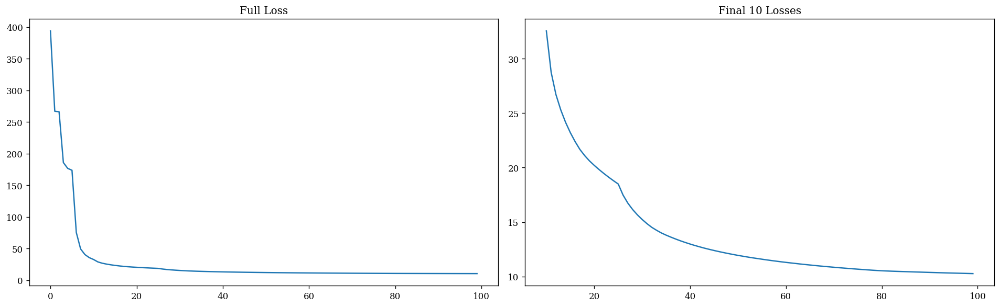

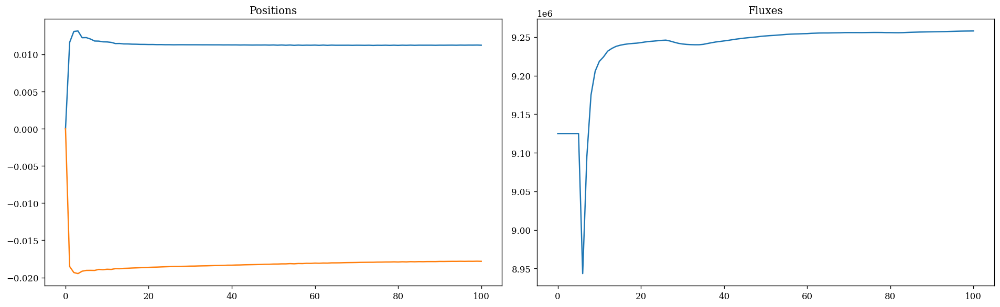

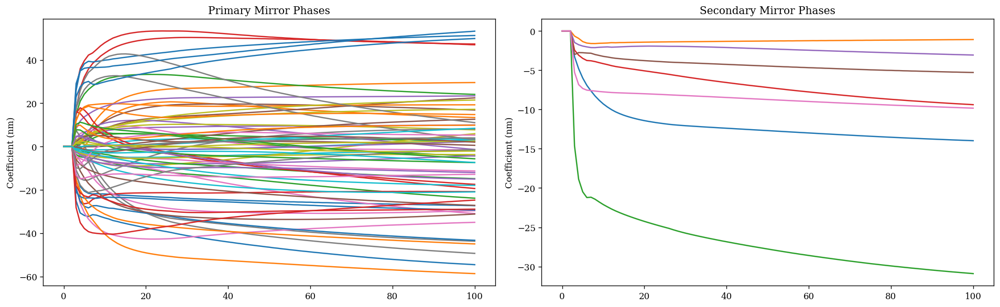

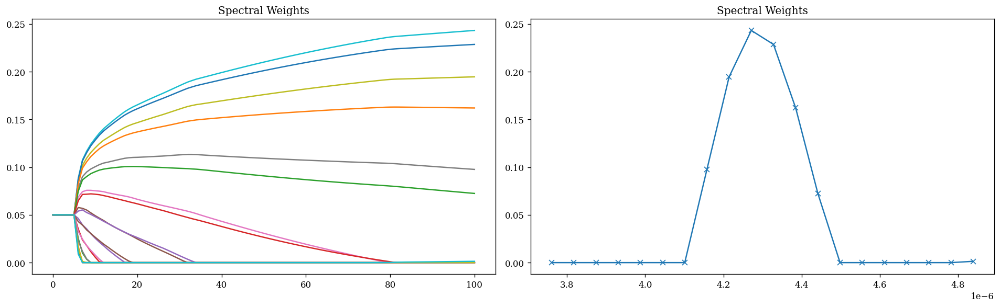

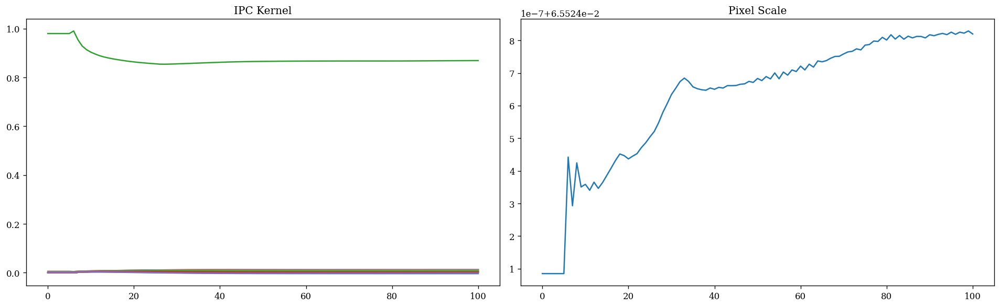

...

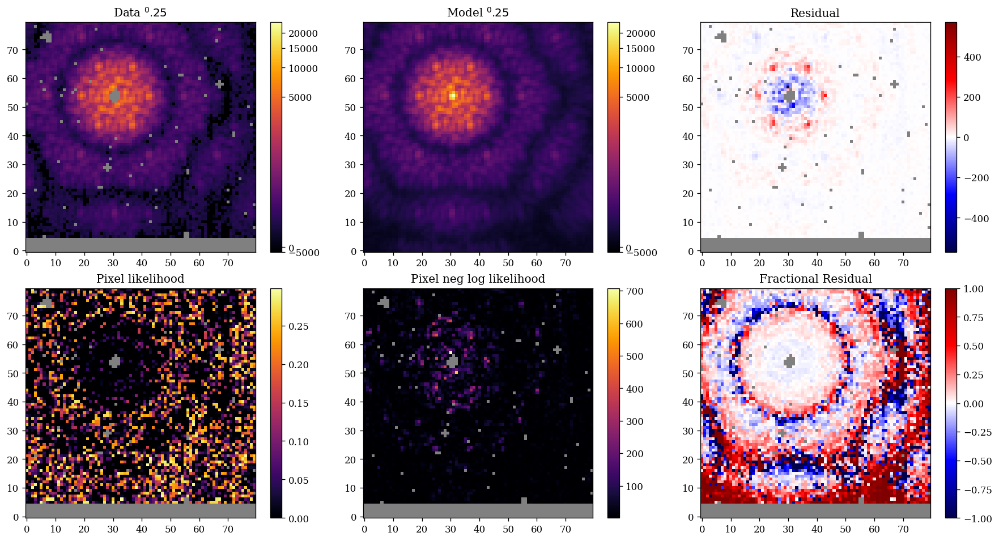

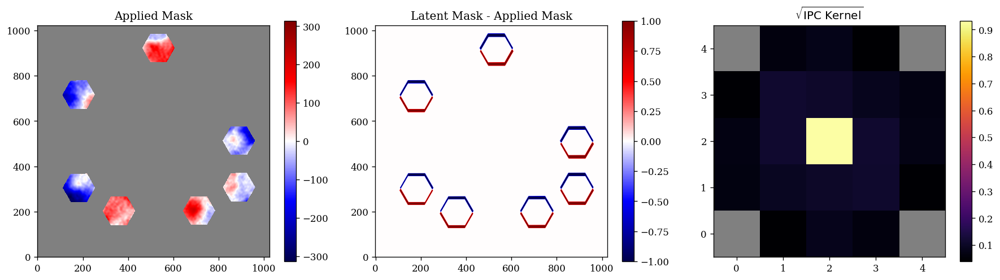

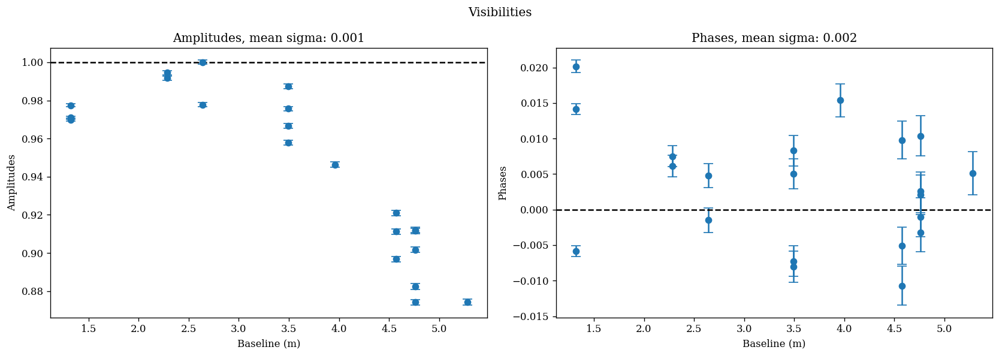

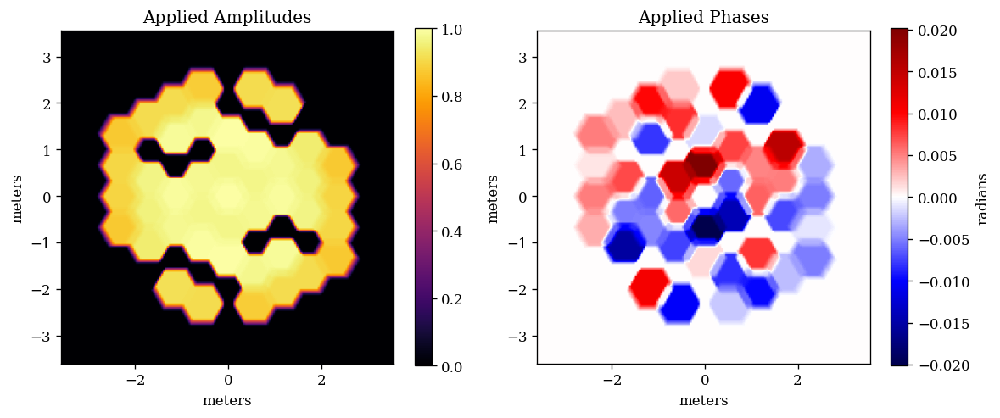

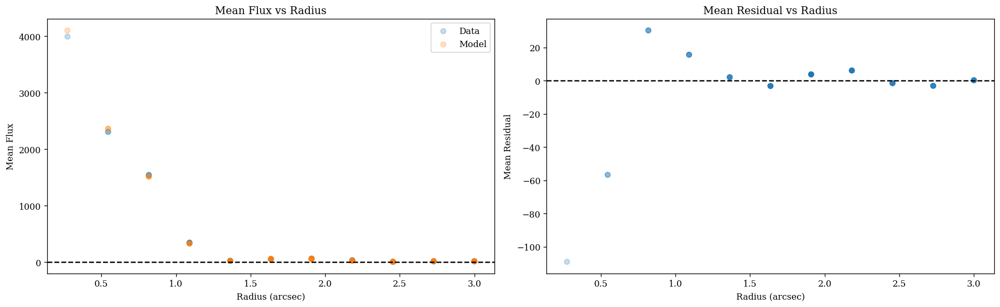

\nPlotting: HD-37093_F380M_016_04

Final loss: 8.941438683661737


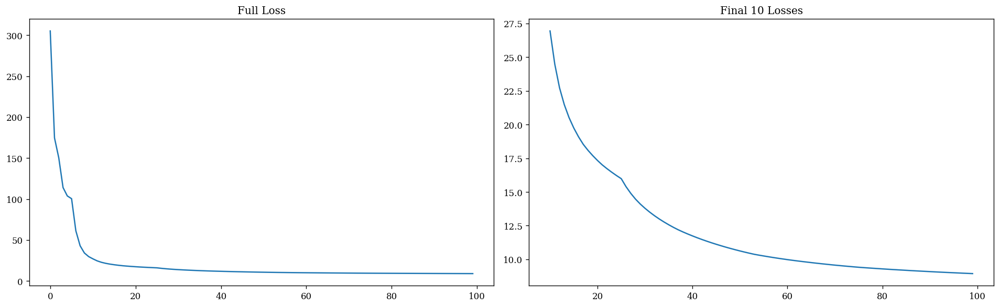

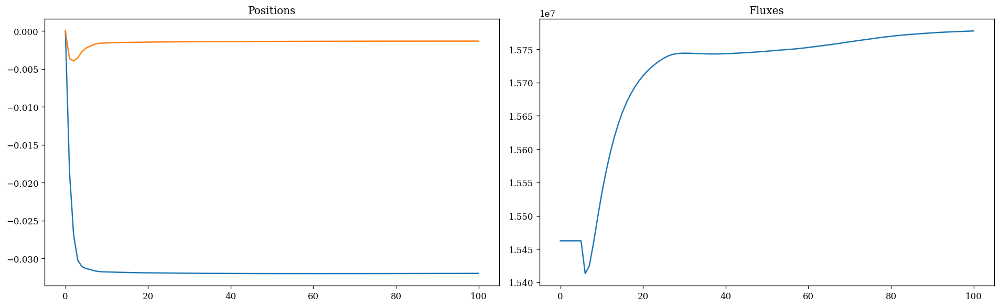

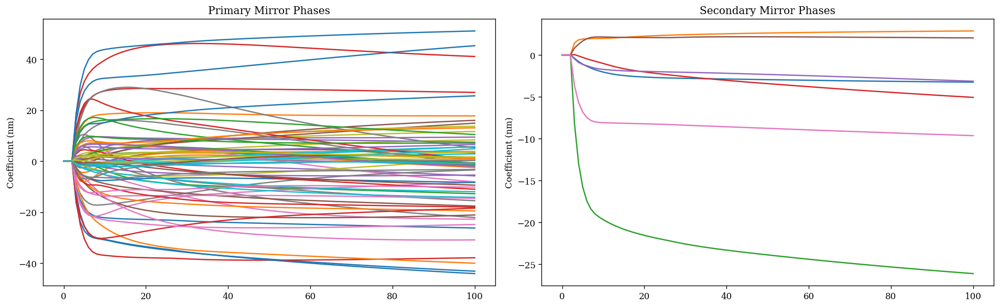

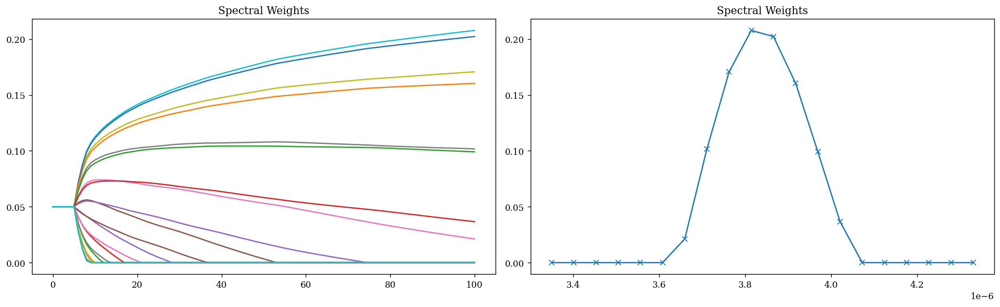

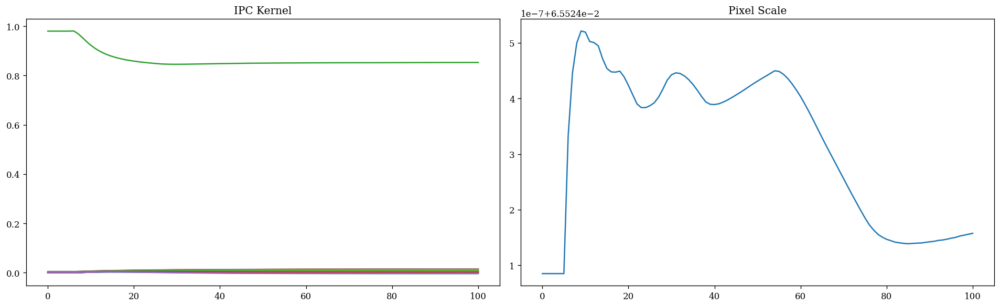

...

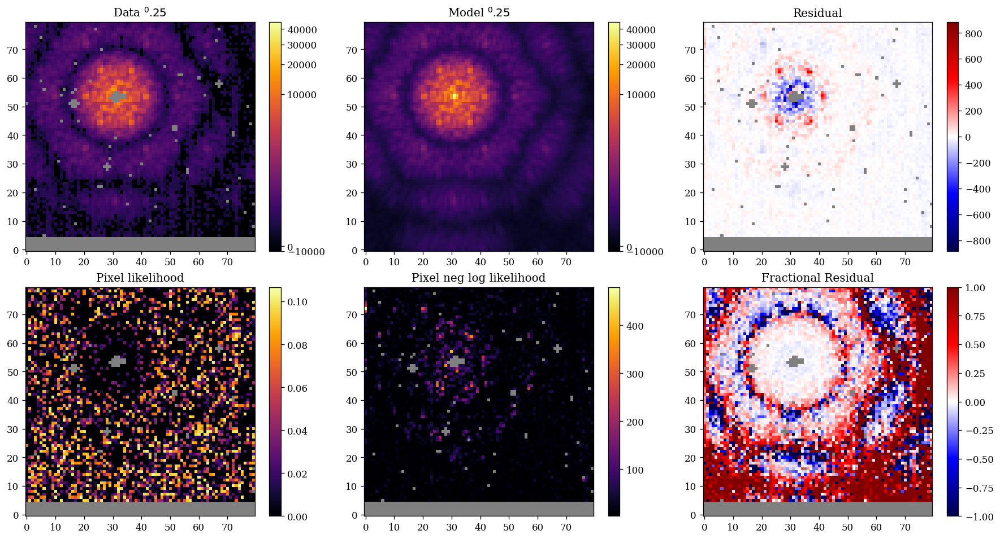

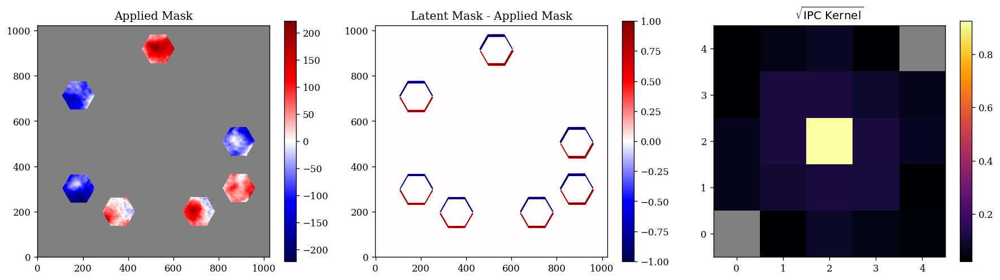

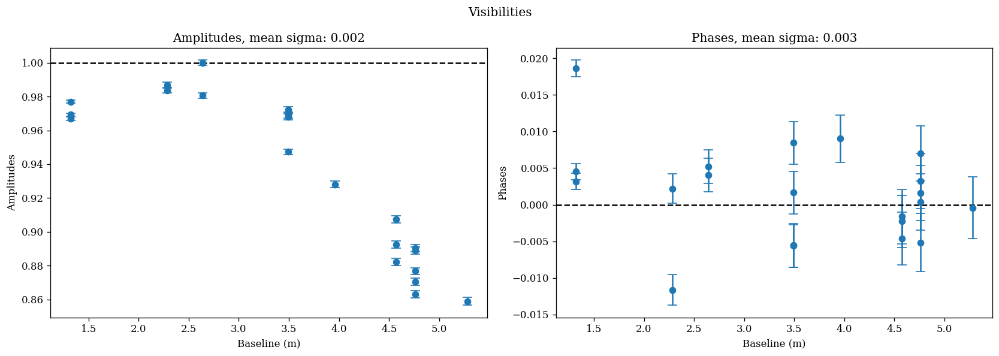

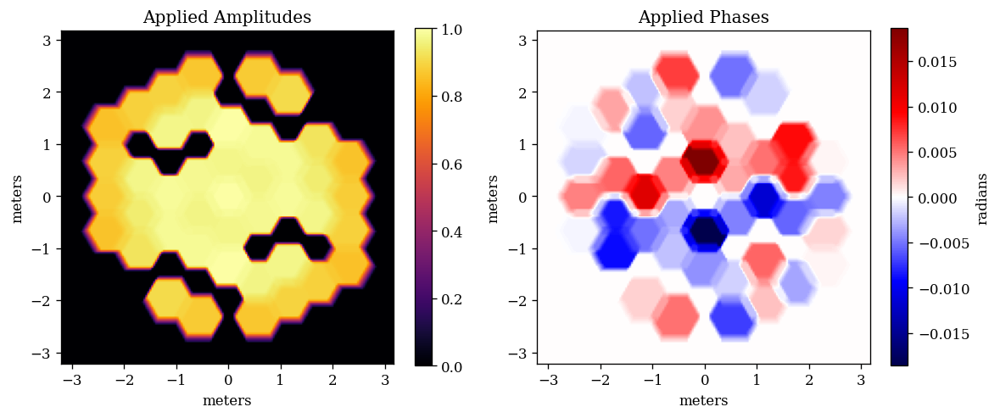

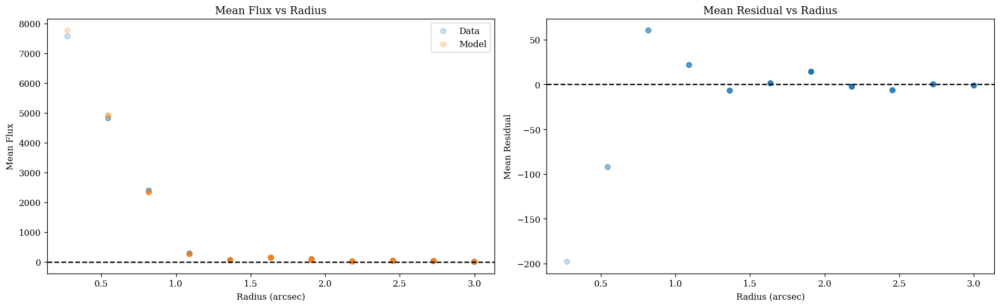

\nPlotting: HD-37093_F480M_016_02

Final loss: 7.508201007621302


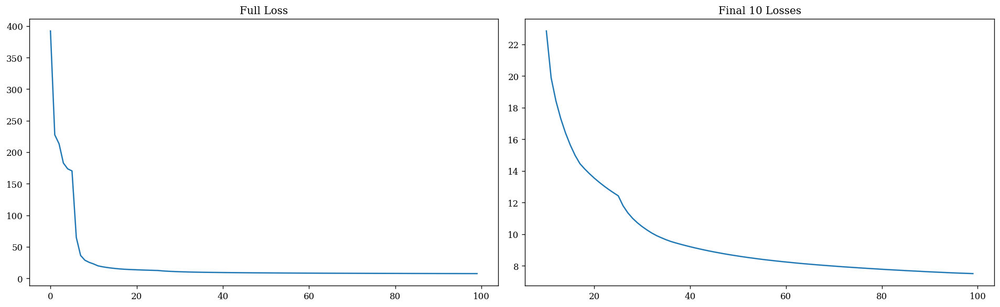

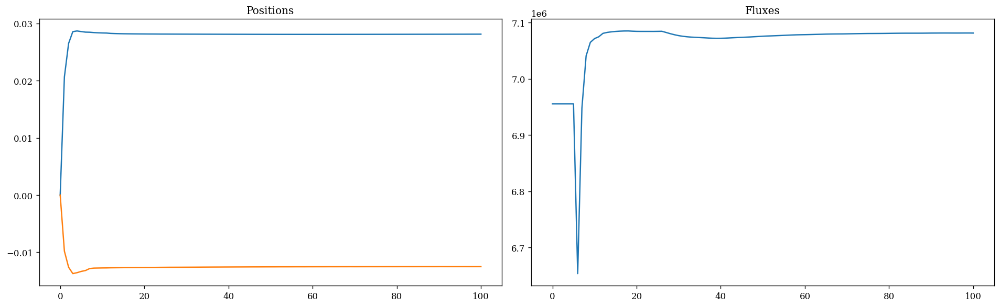

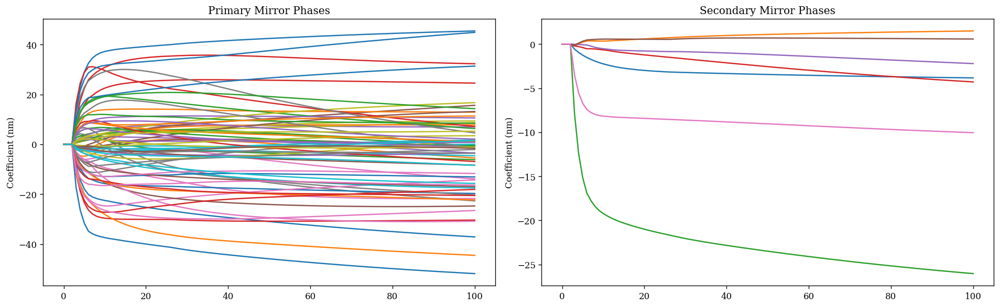

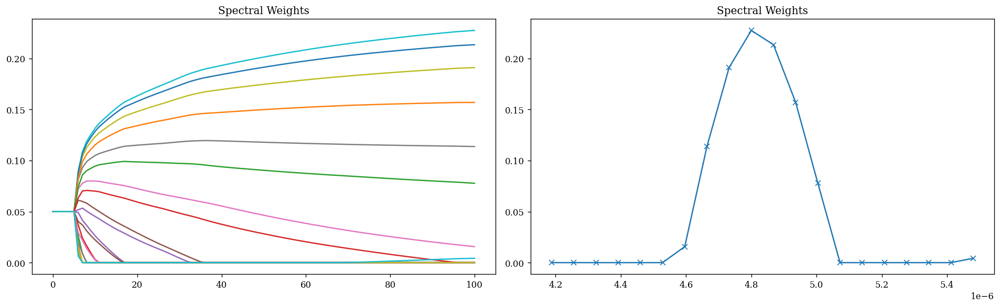

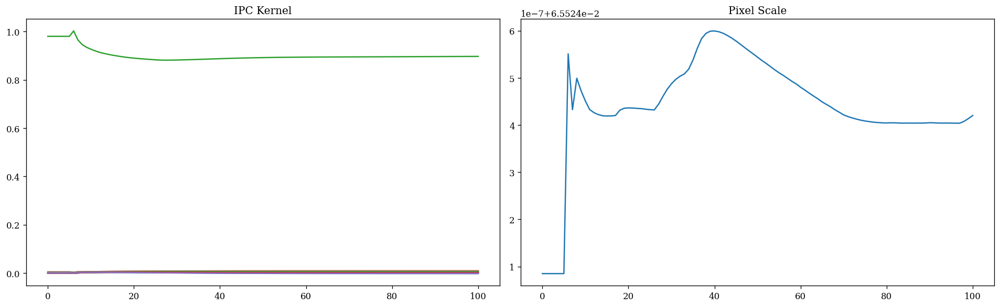

...

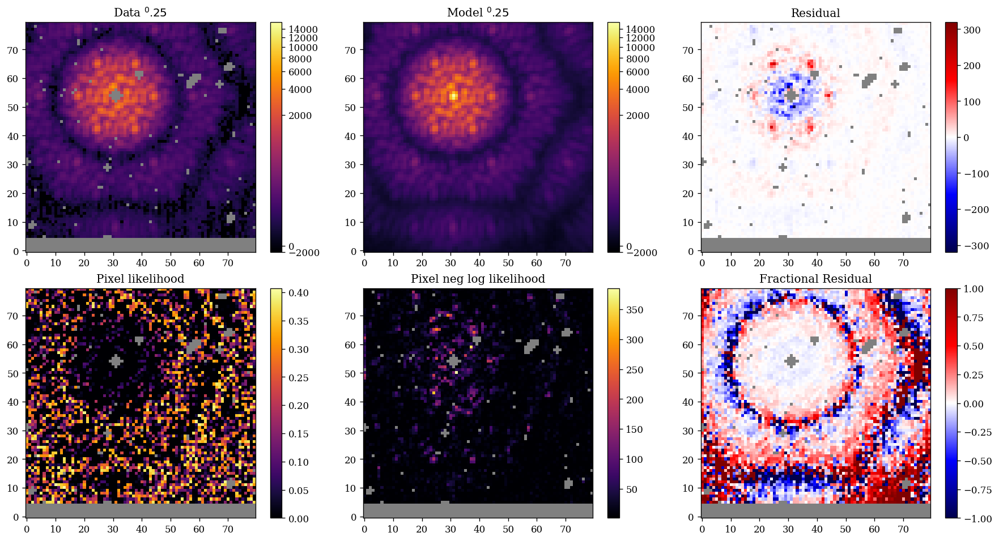

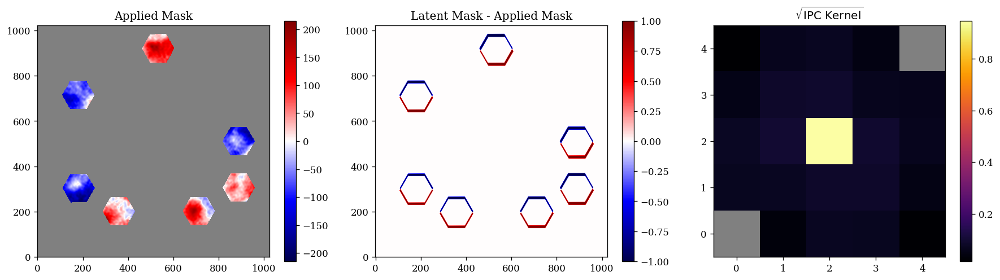

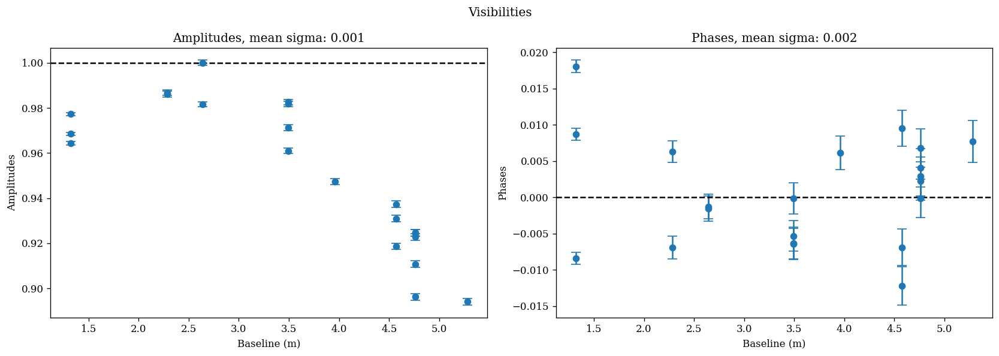

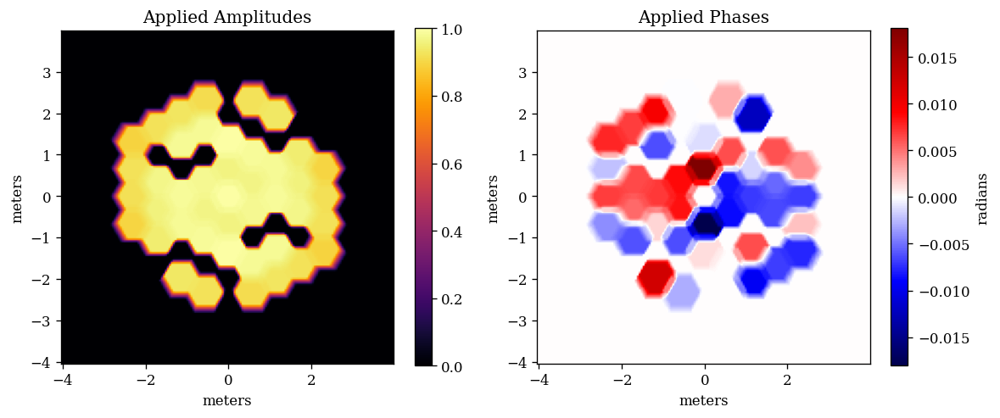

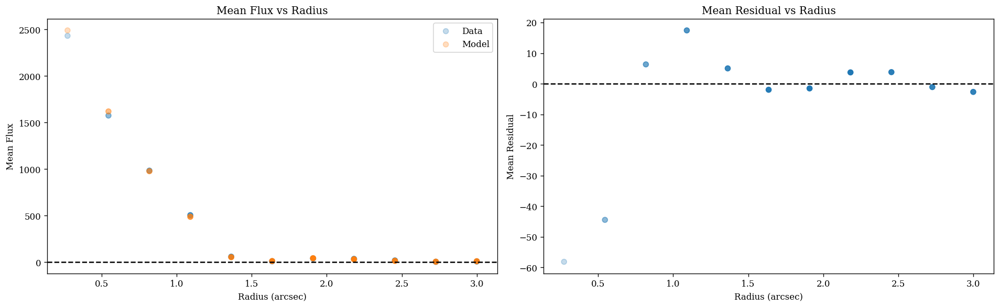

\nPlotting: HD-36805_F430M_019_03

Final loss: 9.865017653326293


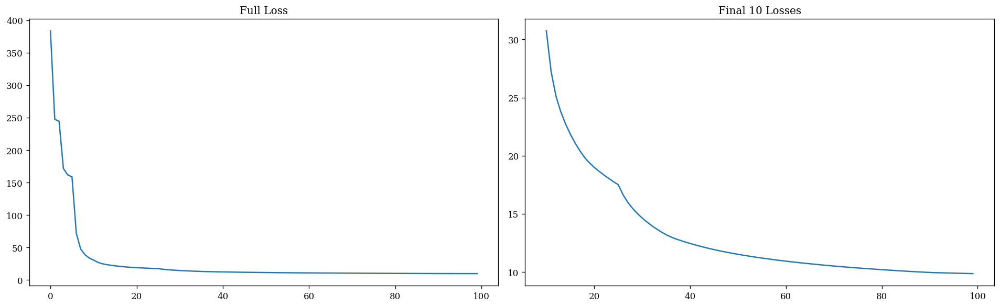

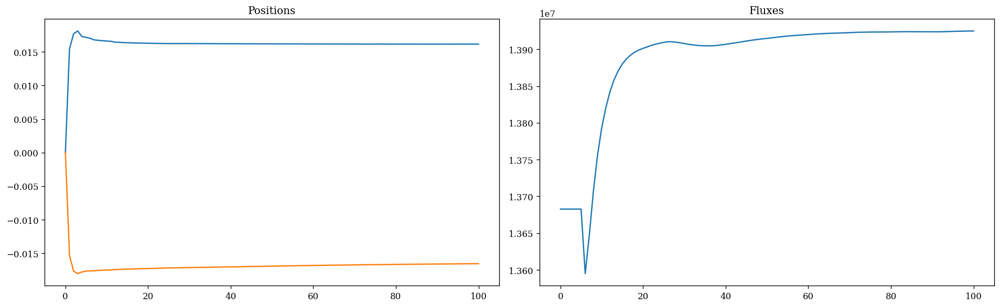

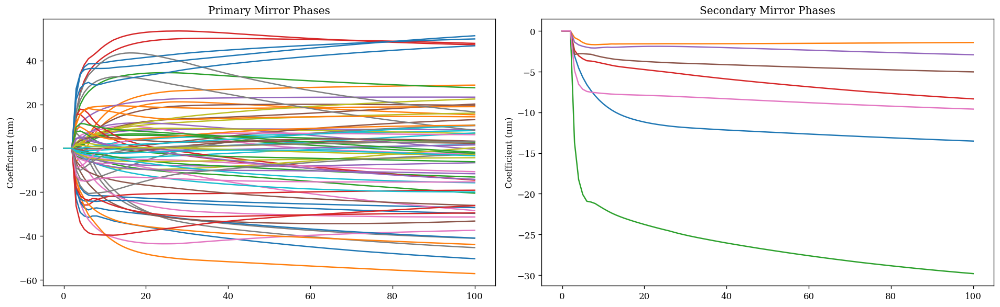

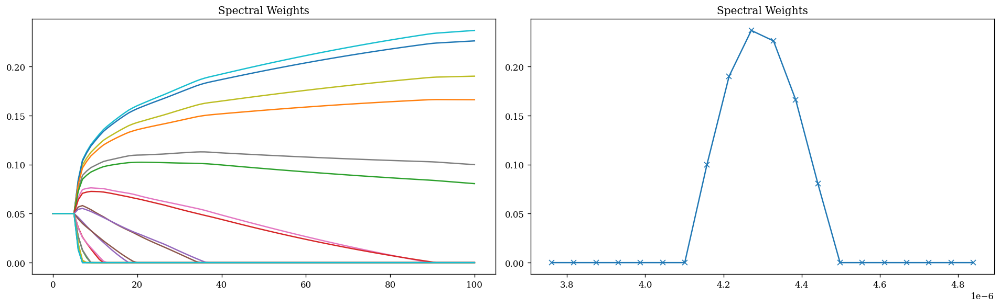

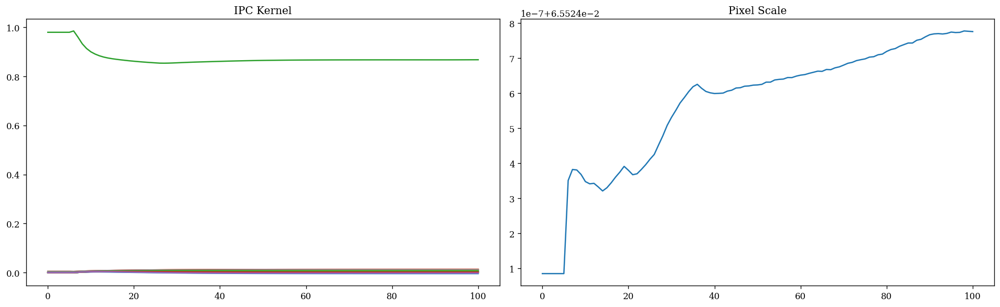

...

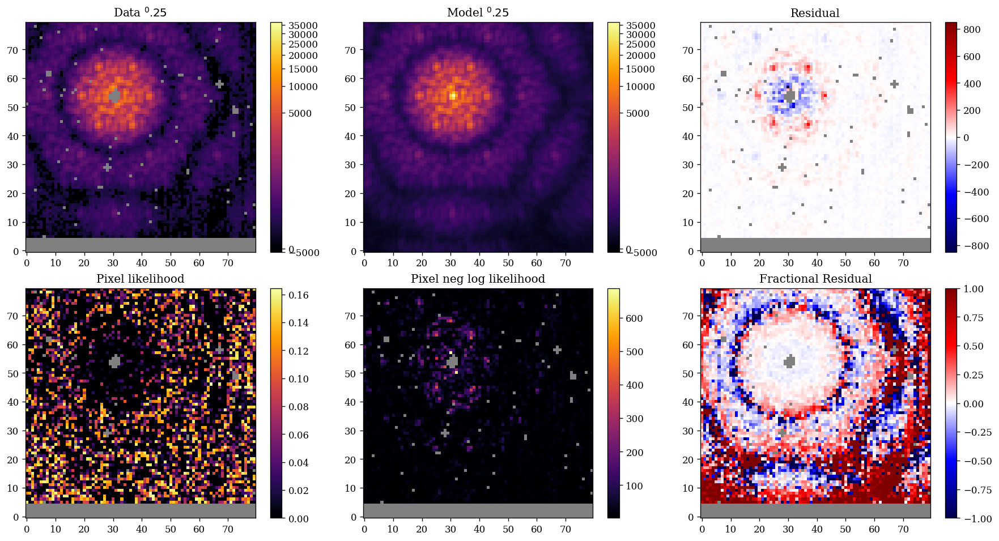

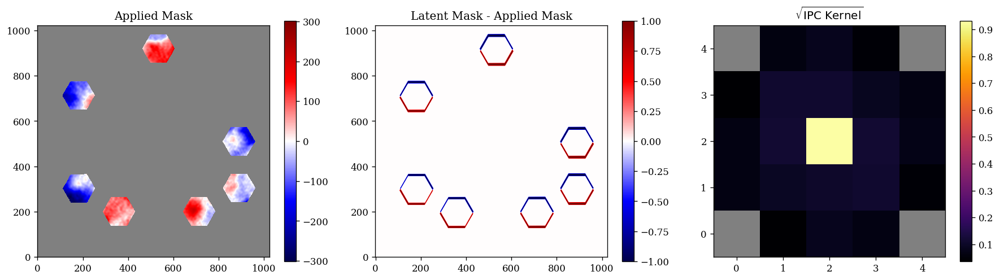

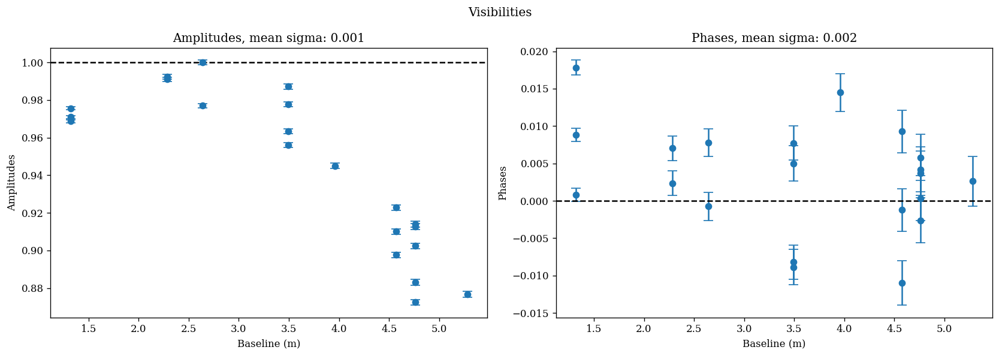

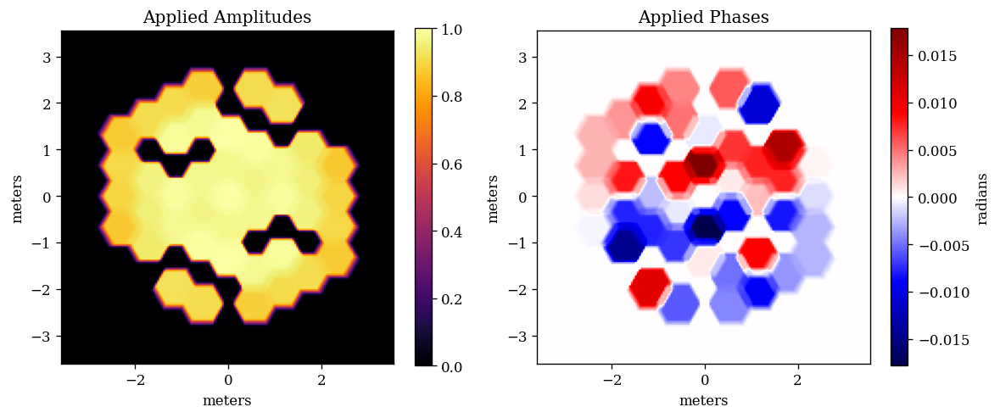

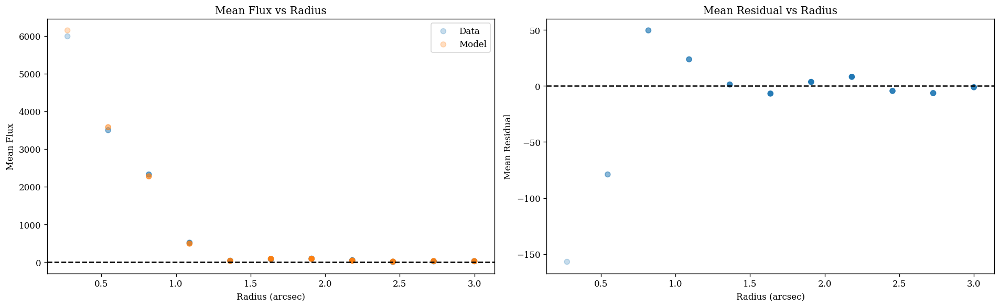

\nPlotting: HD-36805_F380M_019_04

Final loss: 8.532500504242218


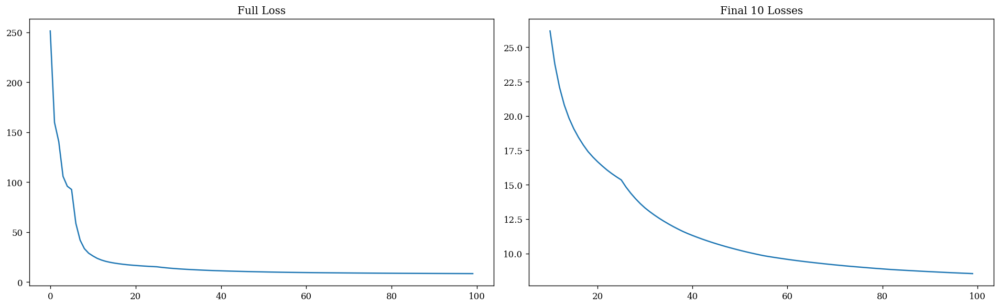

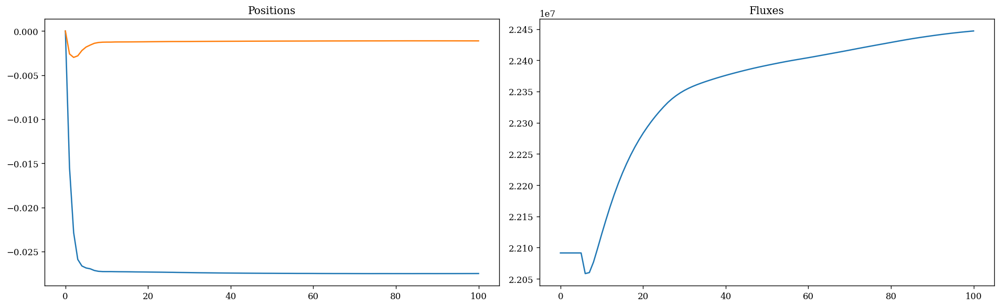

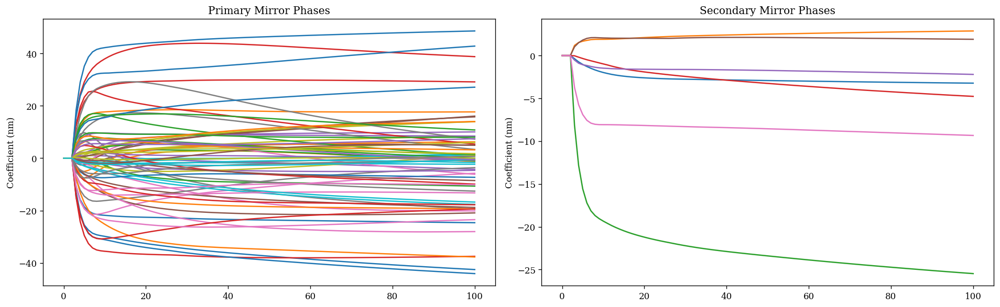

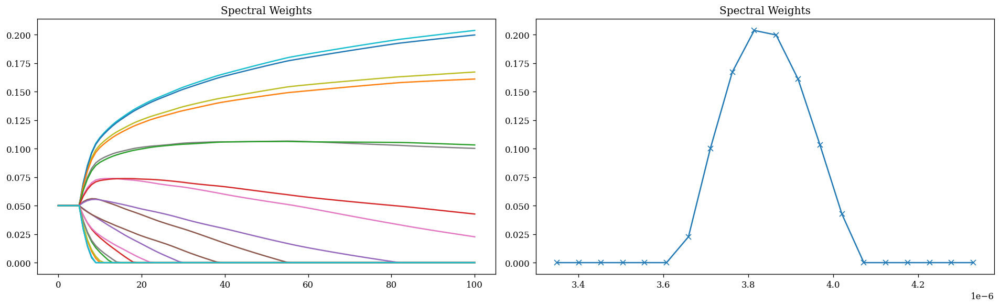

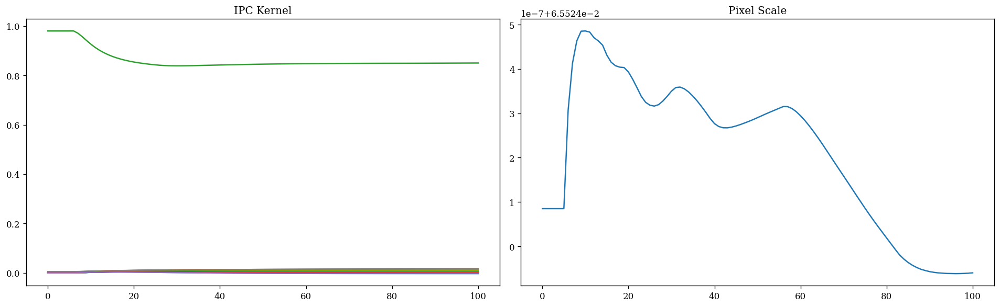

...

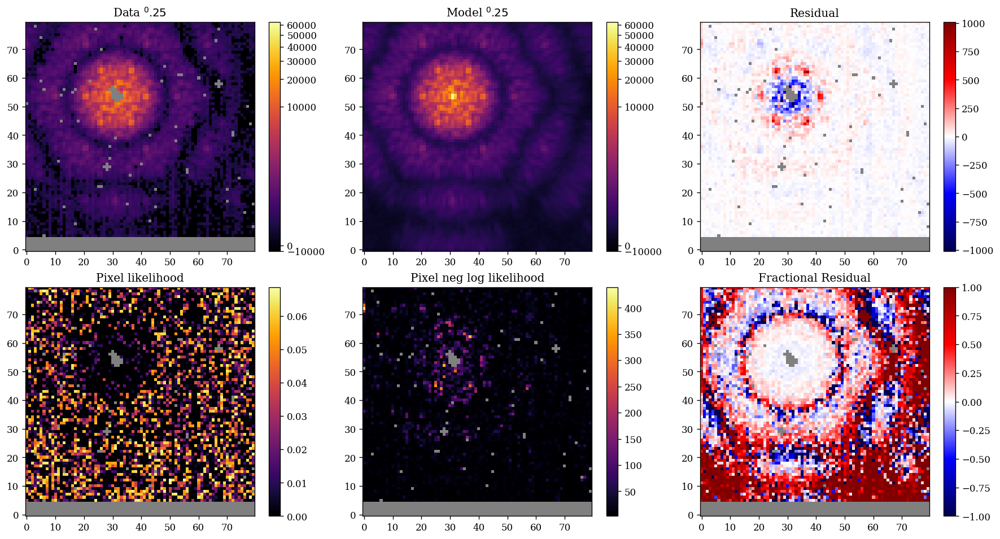

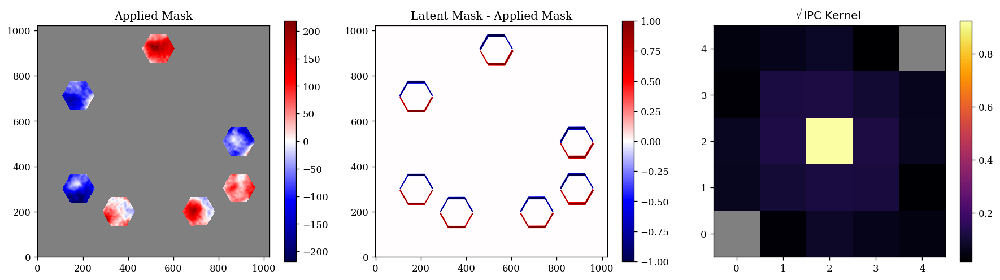

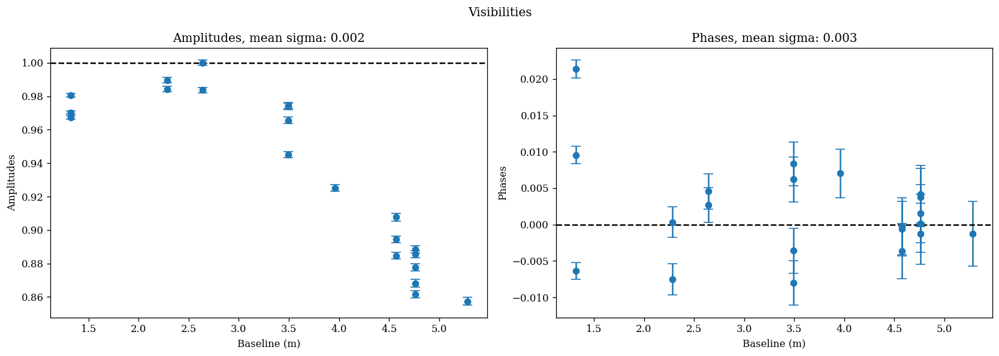

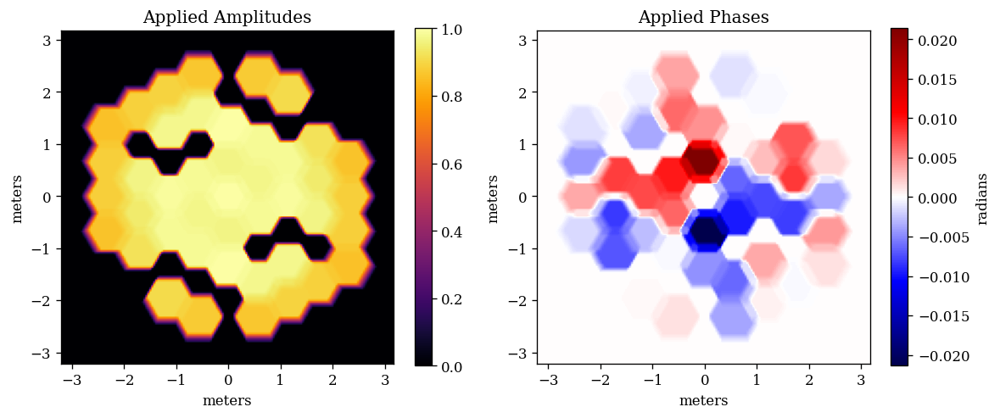

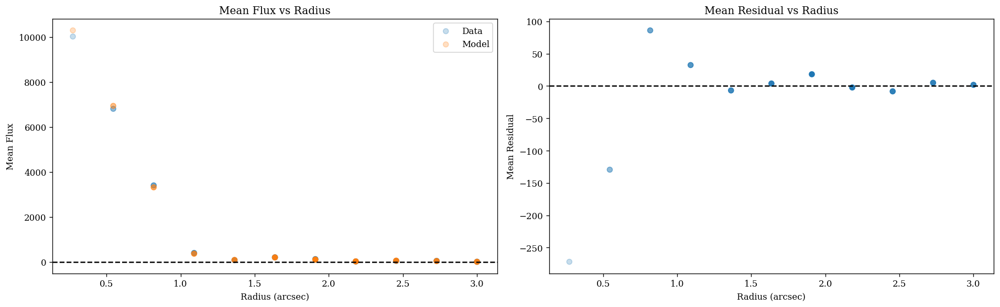

\nPlotting: HD-36805_F480M_019_02

Final loss: 8.383881131391453


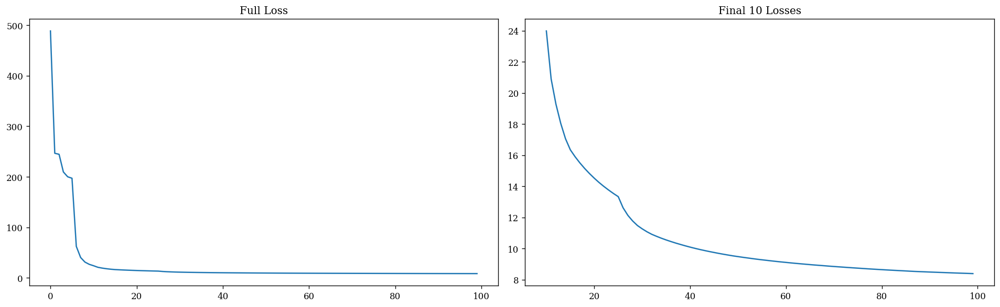

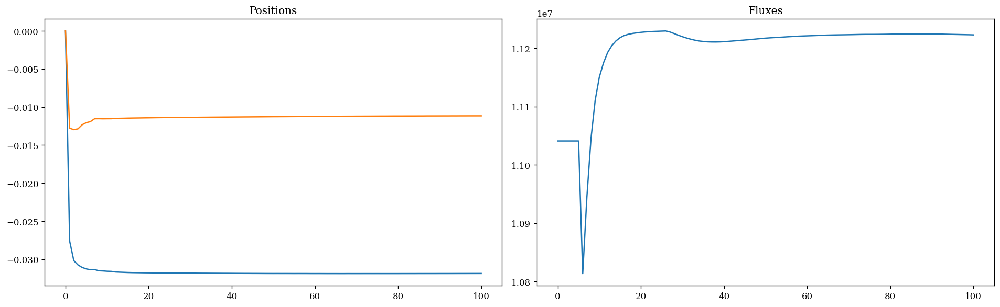

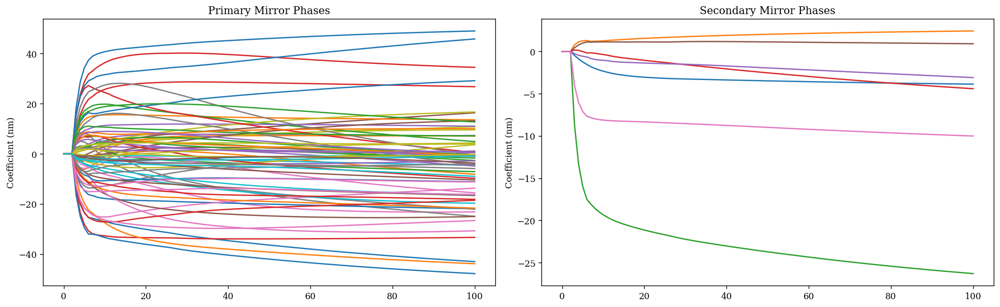

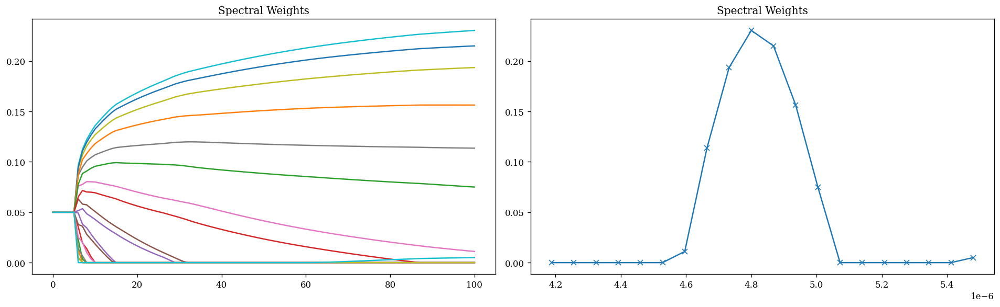

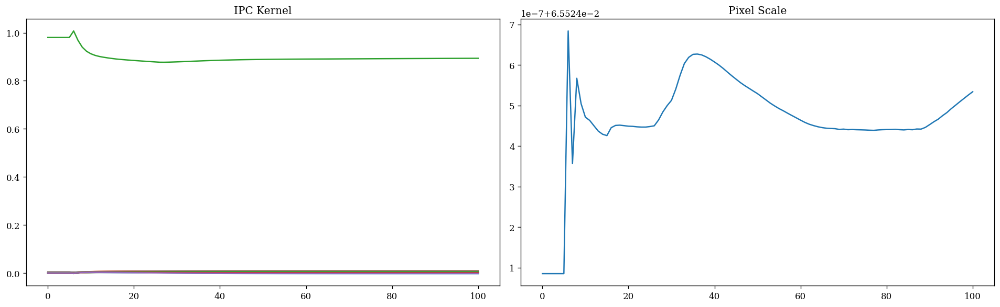

...

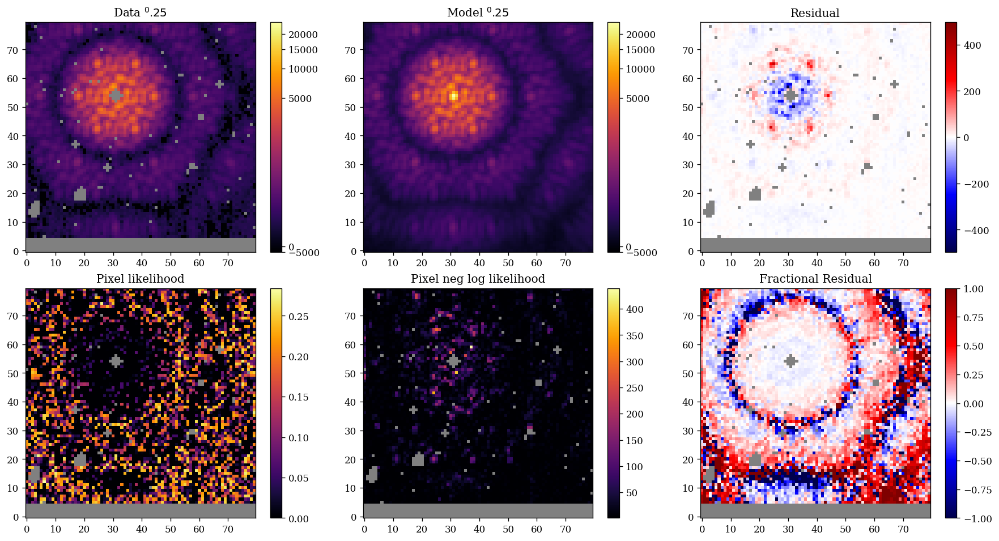

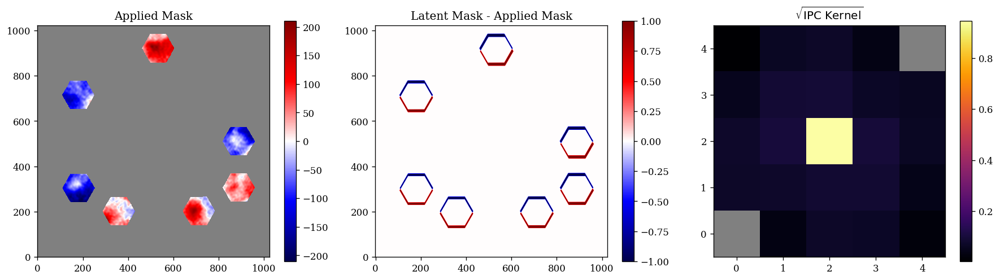

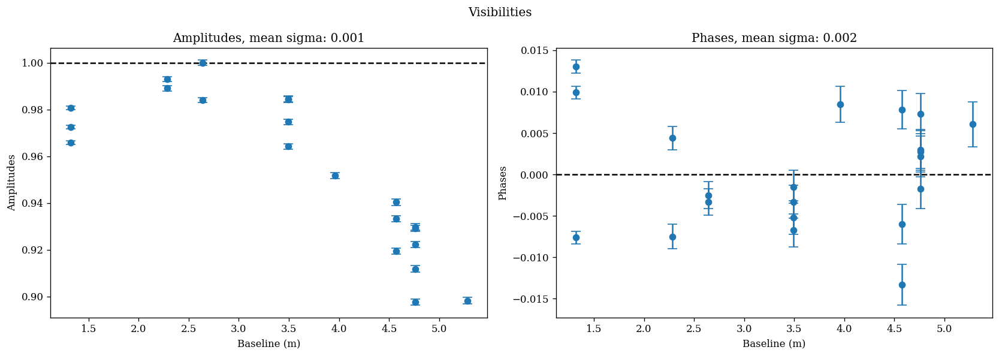

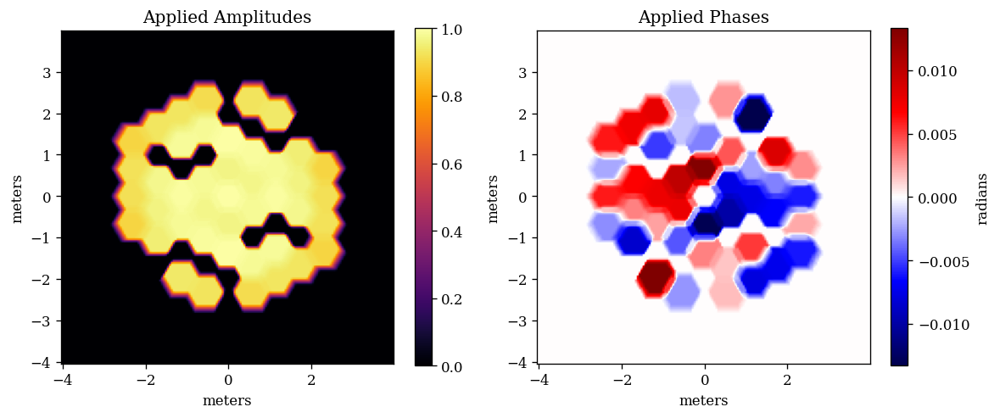

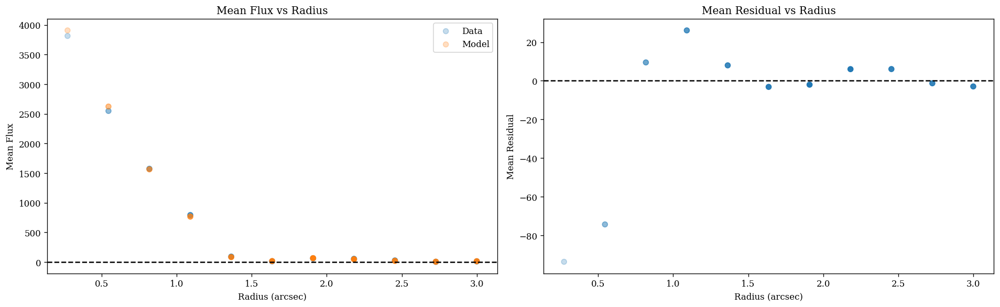

In [6]:
# Plot Results
holes = mask_definitions.jwst_g7s6c()[1]

k = 0.5
inferno = colormaps["inferno"]
seismic = colormaps["seismic"]
seismic.set_bad("k", k)
inferno.set_bad("k", k)

for file in files:
    head = file[0].header
    name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
    print(f"\\nPlotting: {name}\n")

    losses = 1e-4 * np.load(f"files/losses/{name}.npy")
    model = deserialise(f"files/models/{name}.zdx")
    params_out = deserialise(f"files/params/{name}.zdx")
    fim = np.load(f"files/fims/{name}.npy")

    support_mask = get_nan_support(file, n_mask=n_mask, order=dilate)

    for param in params_out.keys():
        model = model.set(param, params_out[param][-1])

    print(f"Final loss: {losses[-1]}")

    plt.figure(figsize=(16, 5))
    plt.subplot(1, 2, 1)
    plt.title("Full Loss")
    plt.plot(losses)

    k = 10
    plt.subplot(1, 2, 2)
    plt.title(f"Final {k} Losses")
    plt.plot(np.arange(k, len(losses)), losses[k:])
    
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(16, 5))
    positions = np.array(params_out["position"])
    plt.subplot(1, 2, 1)
    plt.title("Positions")
    plt.plot(positions - positions[0])

    plt.subplot(1, 2, 2)
    plt.title("Fluxes")
    plt.plot(params_out["flux"])

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(16, 5))
    coeffs = np.array(params_out["coefficients.primary"])
    plt.subplot(1, 2, 1)
    plt.title(f"Primary Mirror Phases")
    plt.ylabel("Coefficient (nm)")
    plt.plot(coeffs.reshape(len(coeffs), -1))

    coeffs = np.array(params_out["coefficients.secondary"])
    plt.subplot(1, 2, 2)
    plt.title(f"Secondary Mirror Phases")
    plt.ylabel("Coefficient (nm)")
    plt.plot(coeffs.reshape(len(coeffs), -1))

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(16, 5))
    plt.subplot(1, 2, 1)
    plt.title(f"Spectral Weights")
    plt.plot(params_out["weights"])

    plt.subplot(1, 2, 2)
    plt.title(f"Spectral Weights")
    plt.plot(model.wavelengths, model.weights, marker='x')

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(16, 5))
    kern = np.array(params_out["IPC.kernel"])
    plt.subplot(1, 2, 1)
    plt.title(f"IPC Kernel")
    plt.plot(kern.reshape(len(kern), -1))

    plt.subplot(1, 2, 2)
    plt.title(f"Pixel Scale")
    plt.plot(params_out["psf_pixel_scale"])

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(16, 5))
    plt.subplot(1, 2, 1)
    plt.title("Visibility Amplitudes")
    plt.plot(params_out["amplitudes"])

    plt.subplot(1, 2, 2)
    plt.title("Visibility Phases")
    plt.plot(params_out["phases"])

    plt.tight_layout()
    plt.show()

    ################################
    ### AMI Mask Transformations ###
    ################################
    plt.figure(figsize=(16, 10))
    plt.suptitle("AMI Mask Parameters", fontsize=20)
    plt.subplot(3, 2, 1)
    plt.title("Translation")
    plt.plot(params_out["translation"])

    plt.subplot(3, 2, 2)
    plt.title("Rotation")
    plt.plot(params_out["rotation"])

    plt.subplot(3, 2, 3)
    plt.title("Compression")
    plt.plot(params_out["compression"])

    plt.subplot(3, 2, 4)
    plt.title("Shear")
    plt.plot(params_out["shear"])

    plt.tight_layout()
    plt.show()


    from lib import get_likelihoods
    psf = model.model()
    im = np.array(file[1].data).astype(float).at[~support_mask].set(np.nan)
    err = np.array(file[2].data).astype(float).at[~support_mask].set(np.nan)
    res = (im - psf)
    likeli, neg_loglikeli = get_likelihoods(psf, im, err)

    pow = 0.25
    vmax = np.maximum(np.nanmax(np.abs(im)), np.nanmax(np.abs(psf)))
    vmin = np.minimum(np.nanmin(np.abs(im)), np.nanmin(np.abs(psf)))
    norm = colors.PowerNorm(gamma=pow, vmin=-vmin, vmax=vmax)

    plt.figure(figsize=(15, 8))
    plt.subplot(2, 3, 1)
    plt.title(r"Data $^{}$".format(pow))
    plt.imshow(im, cmap=inferno, norm=norm)
    plt.colorbar()

    plt.subplot(2, 3, 2)
    plt.title(f"Model $^{pow}$")
    plt.imshow(psf, cmap=inferno, norm=norm)
    plt.colorbar()

    v = np.nanmax(np.abs(res))
    plt.subplot(2, 3, 3)
    plt.title("Residual")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    plt.subplot(2, 3, 4)
    plt.title("Pixel likelihood")
    plt.imshow(likeli, cmap=inferno)
    plt.colorbar()

    plt.subplot(2, 3, 5)
    plt.title("Pixel neg log likelihood")
    plt.imshow(neg_loglikeli, cmap=inferno)
    plt.colorbar()

    v = 1.0
    plt.subplot(2, 3, 6)
    plt.title("Fractional Residual")
    plt.imshow(res / im, vmin=-v, vmax=v, cmap=seismic)
    plt.colorbar()

    plt.tight_layout()
    plt.show()

    # Get the AMI mask and applied mask
    latent_mask = model.pupil_mask.transmission
    applied_mask = model.pupil_mask.transformed.transmission

    # Get the applied opds in nm and flip to match the mask
    mirror_opd = np.flipud(model.pupil.opd + model.basis_opd) * 1e9
    mirror_opd = mirror_opd.at[np.where(~(applied_mask > 1e-6))].set(np.nan)


    plt.figure(figsize=(15, 8))

    # add AMI piston amplitudes?
    # mask_layer = model.mask_amplitudes
    # basis = dlu.eval_basis(mask_layer.basis, mask_layer.coefficients)
    v = np.nanmax(np.abs(mirror_opd))
    plt.subplot(2, 3, 1)
    plt.title("Applied Mask")
    plt.imshow(mirror_opd, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    plt.subplot(2, 3, 2)
    plt.title("Latent Mask - Applied Mask")
    plt.imshow(latent_mask - applied_mask, cmap=seismic)
    plt.colorbar()

    plt.subplot(2, 3, 3)
    plt.title(r"$\sqrt{\text{IPC Kernel}}$")
    plt.imshow(model.IPC.kernel ** 0.5, cmap=inferno)
    plt.colorbar()

    plt.tight_layout()
    plt.show()

    plot_vis(holes, model, fim)
    # plot_vis(holes, model)
    show_splodges(model, s=85, k=0.5)


    # Plot flux and residual with radius
    radii = np.linspace(0, 3, 12)
    coords = dlu.pixel_coords(model.psf_npixels, model.psf_pixel_scale * model.psf_npixels)
    coords += (model.position * np.array([-1, 1]))[:, None, None]
    rs = np.hypot(*coords)

    im_radial_mean, psf_radial_mean, radial_support = [], [], []
    for r in range(len(radii) - 1):
        inner = rs <= radii[r]
        outer = rs <= radii[r + 1]
        annulus = np.logical_xor(inner, outer)

        nan_im = im.at[np.where(~annulus)].set(np.nan)
        nan_psf = psf.at[np.where(~annulus | ~support_mask)].set(np.nan)

        im_radial_mean.append(np.nanmean(nan_im))
        psf_radial_mean.append(np.nanmean(nan_psf))
        radial_support.append(np.sum(~np.isnan(nan_im)))

    im_radial_mean = np.array(im_radial_mean)
    psf_radial_mean = np.array(psf_radial_mean)
    radial_support = np.array(radial_support)

    hex_fringe = dlu.rad2arcsec(4.8e-6 / 0.82)  # Is this right??
    alpha = (radial_support / radial_support.max()) ** 0.5

    plt.figure(figsize=(16, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(radii[1:], im_radial_mean, alpha=alpha, label="Data")
    plt.scatter(radii[1:], psf_radial_mean, alpha=alpha, label="Model")
    plt.axhline(0, c="k", ls="--")
    plt.title("Mean Flux vs Radius")
    plt.xlabel("Radius (arcsec)")
    plt.ylabel("Mean Flux")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.title("Mean Residual vs Radius")
    plt.scatter(radii[1:], im_radial_mean - psf_radial_mean, alpha=alpha, label="Data")
    # plt.scatter(radii[1:], im_radial_mean / psf_radial_mean, alpha=alpha, label="Data")
    plt.axhline(0, c="k", ls="--")
    plt.xlabel("Radius (arcsec)")
    plt.ylabel("Mean Residual")
    
    plt.tight_layout()
    plt.show()